In [1]:
import numpy as np
import pandas as pd
pd.set_option('max_rows', 100)
pd.set_option('max_columns', 100)
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
feed = pd.read_csv('feed_info.csv')
feed_em = pd.read_csv('feed_embeddings.csv')
submit = pd.read_csv('submit_demo_初赛a.csv')
test = pd.read_csv('test_a.csv')
action = pd.read_csv('user_action.csv')

# Feed表
包含了物品(视频)的基本信息和文本,音频,视频等多模态特征

In [3]:
feed.head(10)

,feedid,authorid,videoplayseconds,description,ocr,asr,bgm_song_id,bgm_singer_id,manual_keyword_list,machine_keyword_list,manual_tag_list,machine_tag_list,description_char,ocr_char,asr_char
0,43549,6165,38,104741 122649 8109 117252 65632 23463 118668 4...,139499 59421 82007 142955 27736 83577 52394 11...,142955 27736 83577 103956 32010 34170 89740 90...,19356.0,11703.0,15506;7715;17582,26334;219;25209;7715;18541,81;269;159;6,269 0.8525666;81 0.8525666;8 1.1e-07;306 0.0;2...,26439 5247 6426 3827 1882 26018 20744 22204 30...,25926 8491 13394 2203 26439 6243 33054 16435 1...,2203 26439 6243 33054 16435 16307 17070 24908 ...
1,77432,9386,60,35753 27736 146603 73055 11794 101761 11794 81...,35753 146603 73055 11794 101761 67496 16933 52...,146739 14368 79290 79213 47366 8109 33194 1198...,NaN,NaN,8199;18322;4243,24078;19924,194;267;159;6,267 0.99293476;194 0.99293476,31010 32495 6243 13923 15360 30483 2709 26084 ...,31010 32495 13923 15360 30483 2709 26084 15160...,7259 20851 5061 26207 17573 17531 15117 20072 ...
2,12921,2996,15,114413 107973 117252 27736 41035 32715 125374 ...,NaN,NaN,10288.0,11354.0,NaN,11696;6926,202;23;160;6,23 0.64771646;202 0.64771646,27077 10050 27464 20072 26018 6243 21492 14750...,NaN,NaN
3,34538,12577,18,60473 9864 8109 135558 108803 89307 37630 6481...,39654 95201 22675 49521 135558 108803 89307 37...,7446 47082 37630 99660 9844 113002 9844 113002...,24435.0,13645.0,5454;1197;3727,NaN,328;13;159;6,267 0.21298289;191 0.21298289;8 0.34298885;306...,21489 24672 2223 1882 4956 1545 10424 19791 12...,9015 21209 5026 11192 4956 1545 10424 19791 12...,20825 13395 14765 24513 7305 12837 10337 8885 ...
4,75414,7185,16,105860 4691 134820 55911 80449 79213 23233 139...,73055 66447 88970,104002 4438 104002 4438,23428.0,10730.0,17083;4123,8058;219;21639;15621;25209,81;269;159;6,269 0.86163938;81 0.86163938,25782 19583 7768 3907 14068 12681 5043 17859 1...,30483 23721 1518 22741 25118,23112 969 23112 969
5,34539,2595,43,123046 116187 8092 22091 77895 11717 93522 100...,61498 70163 1428 123046 116187 44971 3063 3214...,147566 45843 10952 25290 79030 11717 34198 993...,16541.0,17296.0,529;2666;26954,529;9298,45;239;159;169,239 0.68520623;45 0.68520623;8 0.0;306 0.0;207...,27442 1543 31605 1868 20857 22179 17181 7261 8...,13842 6439 32379 25274 8847 1251 27442 1543 31...,15371 6498 31376 30024 24307 21492 10083 20072...
6,101310,8115,15,106872 36623 26564 8109 110838 148383 26564 33...,9837 110838 148383 26564 33895 110690 133005,117252 44854 26564 110142 93536 91254 8109 983...,19367.0,10532.0,NaN,18351;13433;25057;11002;14687;10664;19485;12865,9;6,237 0.90296459;246 0.90296459,20831 11704 11598 11354 5967 1882 1217 23805 1...,2200 1217 23805 10083 14040 5967 12194 13395 1...,26018 10155 5967 24513 20833 5311 32214 1882 2...
7,13769,11696,25,144240 54435 37630 117252 27736 40670 134820 1...,63733 106137 31785 73044 25794 65020 90843 107...,123075 11342 79301 23908 110100 112151 110677 ...,NaN,NaN,NaN,8800;11061;15752,9;6,17 0.74826479;37 0.74826479,12783 22473 5277 10040 12837 26018 6243 8311 3...,20857 15640 7261 23039 30060 32499 5009 8481 7...,30191 2606 17583 5391 20861 15640 12836 4895 1...
8,6311,9533,60,102036 39661 66989 110142 118715 93522 24335 8...,122344 140404 55785 26564 93563 102383 27736 7...,90843 31279 117347 116237 8109 287 49575 56976...,NaN,NaN,NaN,17892;18428,9;6,235 0.36773422;204 0.36773422,2682 32028 12649 7461 4913 29499 24513 24368 2...,12676 3901 31177 12653 5967 20857 3653 11877 6...,26018 2223 30031 2220 26054 18659 15360 1882 6...
9,6801,13501,14,45012 25146 45443 122452 875 80983 8109 25146 ...,20248 33368 37767 37767 82007 78435 69591 9354...,90290 77895 25146 106949 129539 106793 304 277...,NaN,NaN,15506;17582;10844,25209;219;4826;25500,81;269;159;6,269 0.96752864;81 0.96752864,10226 13505 15360 10326 17526 26208 253 12762 ...,27393 7536 7349 7349 17323 11893 20838 18755 3...,20085 17181 13505 15360 23786 14009 12831 2706...


In [4]:
feed.describe()

,feedid,authorid,videoplayseconds,bgm_song_id,bgm_singer_id
count,106444.000000,106444.000000,106444.000000,53462.000000,53462.000000
mean,56443.543704,9488.196639,34.446545,12556.594946,8795.041338
std,32582.304899,5384.927792,277.086122,7319.430812,5023.494371
min,0.000000,0.000000,2.000000,0.000000,0.000000
25%,28243.750000,4844.750000,14.000000,6137.000000,4589.250000
50%,56419.500000,9584.000000,26.000000,12518.500000,8614.000000
75%,84659.250000,14122.000000,54.000000,18965.750000,13218.000000
max,112871.000000,18788.000000,59960.000000,25158.000000,17499.000000


In [5]:
feed.shape

(106444, 15)

In [6]:
feed.isnull().sum() / feed.shape[0]

feedid                  0.000000
authorid                0.000000
videoplayseconds        0.000000
description             0.031547
ocr                     0.278137
asr                     0.257431
bgm_song_id             0.497745
bgm_singer_id           0.497745
manual_keyword_list     0.330916
machine_keyword_list    0.157426
manual_tag_list         0.009545
machine_tag_list        0.005017
description_char        0.031350
ocr_char                0.280673
asr_char                0.257431
dtype: float64

# action表
交互数据(用户行为)表, 包含用户在视频号内一段时间的历史行为数据

In [7]:
action.head(10)

,userid,feedid,date_,device,read_comment,comment,like,play,stay,click_avatar,forward,follow,favorite
0,8,71474,1,1,0,0,1,500,5366,0,0,0,0
1,8,73916,1,1,0,0,0,250,1533,0,0,0,0
2,8,50282,1,1,0,0,0,750,1302,0,0,0,0
3,8,11391,1,1,0,0,1,3750,5191,0,0,0,0
4,8,27349,1,1,0,0,0,250,800,0,0,0,0
5,8,30287,1,1,0,0,0,0,1496,0,0,0,0
6,8,1151,1,1,0,0,0,250,976,0,0,0,0
7,8,69745,1,1,0,0,0,250,817,0,0,0,0
8,8,22451,1,1,0,0,0,0,2014,0,0,0,0
9,8,97911,1,1,0,0,0,250,861,0,0,0,0


In [8]:
action.shape

(7317882, 13)

In [9]:
action.isnull().sum() / action.shape[0]

userid          0.0
feedid          0.0
date_           0.0
device          0.0
read_comment    0.0
comment         0.0
like            0.0
play            0.0
stay            0.0
click_avatar    0.0
forward         0.0
follow          0.0
favorite        0.0
dtype: float64

In [10]:
action['date_'].value_counts()

11    614175
14    609036
10    596886
13    566627
3     543566
12    532038
9     512466
4     504623
8     500120
7     480460
1     478489
6     472726
2     461842
5     444828
Name: date_, dtype: int64

In [11]:
action.describe()

,userid,feedid,date_,device,read_comment,comment,like,play,stay,click_avatar,forward,follow,favorite
count,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06,7.317882e+06
mean,1.249679e+05,5.669863e+04,7.801455e+00,1.765396e+00,3.501587e-02,4.046253e-04,2.580487e-02,2.631760e+04,3.101158e+04,7.533327e-03,3.821188e-03,7.211103e-04,1.342465e-03
std,7.239444e+04,3.278194e+04,4.063833e+00,4.237514e-01,1.838199e-01,2.011123e-02,1.585528e-01,6.477679e+04,1.013239e+05,8.646720e-02,6.169754e-02,2.684381e-02,3.661506e-02
min,8.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,6.133000e+04,2.814900e+04,4.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.017000e+03,5.189000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,1.256370e+05,5.682500e+04,8.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.328900e+04,1.782900e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,1.878630e+05,8.522900e+04,1.100000e+01,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.600000e+04,4.133900e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,2.502360e+05,1.128710e+05,1.400000e+01,2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,3.855337e+07,8.262444e+07,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


In [12]:
target_feat = ['read_comment', 'like', 'click_avatar', 'forward', 'favorite', 'comment', 'follow']
for feat in target_feat:
    print(feat)
    count = action[feat].sum()
    print("The number of %s is %d, the ratio is %.5f" % (feat, count, count/action.shape[0]))

read_comment
The number of read_comment is 256242, the ratio is 0.03502
like
The number of like is 188837, the ratio is 0.02580
click_avatar
The number of click_avatar is 55128, the ratio is 0.00753
forward
The number of forward is 27963, the ratio is 0.00382
favorite
The number of favorite is 9824, the ratio is 0.00134
comment
The number of comment is 2961, the ratio is 0.00040
follow
The number of follow is 5277, the ratio is 0.00072


## 统计不同目标的正样本的重合情况

In [13]:
pos = action.loc[(action['read_comment']+action['like']+action['click_avatar']+action['forward']) > 0]

In [14]:
target_feat = ['read_comment', 'like', 'click_avatar', 'forward']
for feat in target_feat:
    print(feat)
    count = pos[feat].sum()
    print("The number of %s is %d, the ratio is %.5f" % (feat, count, count/pos.shape[0]))

read_comment
The number of read_comment is 256242, the ratio is 0.51534
like
The number of like is 188837, the ratio is 0.37978
click_avatar
The number of click_avatar is 55128, the ratio is 0.11087
forward
The number of forward is 27963, the ratio is 0.05624


In [15]:
for target1 in target_feat:
    for target2 in target_feat:
        if target1 != target2:
            overlap = pos.loc[(pos[target1]+pos[target2])==2]
            print('Overlap between %s and %s: %d' % (target1, target2, overlap.shape[0]))

Overlap between read_comment and like: 17185
Overlap between read_comment and click_avatar: 5724
Overlap between read_comment and forward: 1615
Overlap between like and read_comment: 17185
Overlap between like and click_avatar: 3067
Overlap between like and forward: 3811
Overlap between click_avatar and read_comment: 5724
Overlap between click_avatar and like: 3067
Overlap between click_avatar and forward: 588
Overlap between forward and read_comment: 1615
Overlap between forward and like: 3811
Overlap between forward and click_avatar: 588


In [16]:
for i in range(4):
    index = [0, 1, 2, 3]
    index.remove(i)
    t1 = target_feat[index[0]]
    t2 = target_feat[index[1]]
    t3 = target_feat[index[2]]
    overlap = pos.loc[(pos[t1]+pos[t2]+pos[t3])==3]
    print('Overlap between %s and %s and %s: %d' % (t1, t2, t3, overlap.shape[0]))

Overlap between like and click_avatar and forward: 98
Overlap between read_comment and click_avatar and forward: 105
Overlap between read_comment and like and forward: 360
Overlap between read_comment and like and click_avatar: 508


In [17]:
overlap = pos.loc[(pos['read_comment']+pos['like']+pos['click_avatar']+pos['forward'])==4]
overlap.shape[0]

26

## 统计用户活跃度和物品热度

In [18]:
user_pos = pos.groupby('userid').agg({'like': 'count'})
user_pos = user_pos.reset_index()

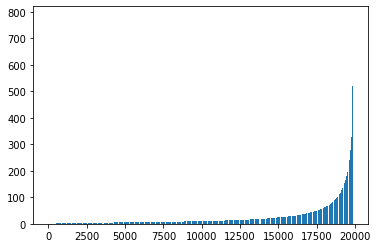

In [19]:
import matplotlib.pyplot as plt
user_pos = user_pos.sort_values(by='like', ascending=True)
plt.bar(range(user_pos.shape[0]), user_pos['like'])
plt.show()

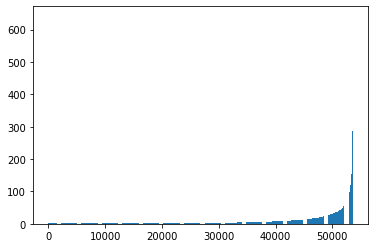

In [20]:
item_pos = pos.groupby('feedid').agg({'like': 'count'})
item_pos = item_pos.reset_index()
item_pos = item_pos.sort_values(by='like', ascending=True)
plt.bar(range(item_pos.shape[0]), item_pos['like'])
plt.show()

In [21]:
# 活跃率
user_act = action.groupby('userid').agg({'like': 'count'})
user_act = user_act.reset_index()
user_pos.rename(columns={'like': 'pos'}, inplace=True)
user_act.rename(columns={'like': 'act'}, inplace=True)
user_ap = pd.merge(user_act, user_pos, how='left', on='userid')
user_ap.fillna(0, inplace=True)
user_ap['pos_ration'] = user_ap['pos'] / user_ap['act']
user_ap.describe()

,userid,act,pos,pos_ration
count,20000.00000,20000.000000,20000.000000,20000.000000
mean,125084.40225,365.894100,24.861250,0.080668
std,72559.17173,242.206111,46.554636,0.113389
min,8.00000,8.000000,0.000000,0.000000
25%,61268.00000,157.750000,5.000000,0.017241
50%,125894.50000,314.000000,10.000000,0.038462
75%,188072.25000,545.000000,23.000000,0.090909
max,250236.00000,980.000000,782.000000,0.981481


In [22]:
item_act = action.groupby('feedid').agg({'like': 'count'})
item_act = item_act.reset_index()
item_pos.rename(columns={'like': 'pos'}, inplace=True)
item_act.rename(columns={'like': 'act'}, inplace=True)
item_ap = pd.merge(item_act, item_pos, how='left', on='feedid')
item_ap.fillna(0, inplace=True)
item_ap['pos_ration'] = item_ap['pos'] / item_ap['act']
item_ap.describe()

,feedid,act,pos,pos_ration
count,96564.000000,96564.000000,96564.000000,96564.000000
mean,56425.159387,75.782714,5.149176,0.056763
std,32579.992745,193.723214,16.452696,0.093041
min,0.000000,1.000000,0.000000,0.000000
25%,28219.750000,5.000000,0.000000,0.000000
50%,56402.500000,16.000000,1.000000,0.027778
75%,84634.250000,59.000000,3.000000,0.081081
max,112871.000000,6841.000000,640.000000,1.000000


In [23]:
action.shape

(7317882, 13)

存在什么操作都没有过的用户

# 测试集

In [24]:
test.head(10)

,userid,feedid,device
0,14298,67227,1
1,68356,91864,2
2,49925,104657,2
3,60529,23738,2
4,131482,69038,1
5,52981,33636,1
6,55058,22853,2
7,78168,100222,1
8,135784,78982,2
9,72975,81367,2


In [25]:
test.shape

(421985, 3)

## feed_embedding表
融合了ocr、asr、图像、文字的多模态的内容理解特征向量

In [40]:
feed_em.head(10)

,feedid,feed_embedding,item_ocr
0,46022,-0.02032269 0.06095614 0.11057708 0.03385210 0...,"[-0.02032269, 0.06095614, 0.11057708, 0.033852..."
1,73903,-0.07594238 0.01796364 -0.00135112 -0.00333468...,"[-0.07594238, 0.01796364, -0.00135112, -0.0033..."
2,88646,-0.05067272 -0.08208735 -0.01929738 -0.0150182...,"[-0.05067272, -0.08208735, -0.01929738, -0.015..."
3,24381,-0.06976026 0.00218324 0.04416835 0.06146711 -...,"[-0.06976026, 0.00218324, 0.04416835, 0.061467..."
4,41542,-0.04981736 -0.03523079 0.03022859 0.06672543 ...,"[-0.04981736, -0.03523079, 0.03022859, 0.06672..."
5,15622,-0.10077595 -0.01764622 0.03897166 -0.04593844...,"[-0.10077595, -0.01764622, 0.03897166, -0.0459..."
6,5662,-0.07481042 -0.07795808 0.00200225 -0.02691050...,"[-0.07481042, -0.07795808, 0.00200225, -0.0269..."
7,4282,-0.00903127 0.04316609 0.06915708 0.00960549 0...,"[-0.00903127, 0.04316609, 0.06915708, 0.009605..."
8,26337,-0.04625623 -0.01046129 0.08407867 -0.00102488...,"[-0.04625623, -0.01046129, 0.08407867, -0.0010..."
9,64025,-0.03590044 0.01959696 0.01913530 0.03326439 0...,"[-0.03590044, 0.01959696, 0.0191353, 0.0332643..."


In [39]:
feed_em['item_ocr'] = feed_em['feed_embedding'].apply(lambda x: np.array(x.split(' ')[0:512]).astype(np.float))

In [42]:
pretrain = feed_em[['feedid', 'item_ocr']].rename(columns={'feedid': 'item_id'})

In [43]:
pretrain.head(10)

,item_id,item_ocr
0,46022,"[-0.02032269, 0.06095614, 0.11057708, 0.033852..."
1,73903,"[-0.07594238, 0.01796364, -0.00135112, -0.0033..."
2,88646,"[-0.05067272, -0.08208735, -0.01929738, -0.015..."
3,24381,"[-0.06976026, 0.00218324, 0.04416835, 0.061467..."
4,41542,"[-0.04981736, -0.03523079, 0.03022859, 0.06672..."
5,15622,"[-0.10077595, -0.01764622, 0.03897166, -0.0459..."
6,5662,"[-0.07481042, -0.07795808, 0.00200225, -0.0269..."
7,4282,"[-0.00903127, 0.04316609, 0.06915708, 0.009605..."
8,26337,"[-0.04625623, -0.01046129, 0.08407867, -0.0010..."
9,64025,"[-0.03590044, 0.01959696, 0.0191353, 0.0332643..."


## 检查有多少冷启动用户和样本, 来判断是否可以使用协同过滤类算法

In [27]:
train_user_set = set(action['userid'])
train_item_set = set(action['feedid'])
test_user_set = set(test['userid'])
test_item_set = set(test['feedid'])

In [28]:
len(test_user_set - train_user_set) / len(test_user_set), len(test_item_set - train_item_set) / len(test_item_set)

(0.0, 0.07415308473419234)

用户中没有冷启动用户, 但物品中有约7.4%的冷启动物品

In [29]:
test['feedid'].nunique(), action['feedid'].nunique(), feed['feedid'].nunique()

(35157, 96564, 106444)

In [30]:
len(test_item_set - train_item_set)

2607